In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pickle
import lipd
plt.style.use('ggplot') 

In [6]:
# Declare working directory (location of .pkl file)
data_dir = './' 

# Declare latest database version
version  = '1_0_0'

file_to_open = open("/glade/work/zilumeng/3D_trans/OBS/CoralHydro2k_Python.pkl",'rb')
proxies_all  = pickle.load(file_to_open)['D']
file_to_open.close()

# Extract the time series 
# Example 1. Extract Sr/Ca records in the Pacific Ocean under group 1
all_TS      = lipd.extractTs(proxies_all)
filtered_TS = lipd.filterTs(all_TS, 'geo_ocean == Pacific Ocean')
filtered_TS = lipd.filterTs(filtered_TS, 'paleoData_coralHydro2kGroup == 1')
filtered_TS = lipd.filterTs(filtered_TS, 'paleoData_variableName == SrCa')
n_proxies   = len(filtered_TS)

extracting paleoData...
extracting: KA17RYU01
extracting: CH18YOA02
extracting: FL17DTO02
extracting: BO14HTI01
extracting: AB20MEN01
extracting: DR99ABR01
extracting: OS13NLP01
extracting: ZI04IFR01
extracting: CH18YOA01
extracting: FL17DTO01
extracting: SA16CLA01
extracting: AB20MEN03
extracting: TU01DEP01
extracting: BO14HTI02
extracting: AB20MEN02
extracting: CO00MAL01
extracting: SW98STP01
extracting: AB20MEN06
extracting: AB08MEN01
extracting: RE18CAY01
extracting: HE13MIS02
extracting: CA13SAP01
extracting: MO06PED01
extracting: AB20MEN07
extracting: DR00NBB01
extracting: ZI16ROD01
extracting: DR00KSB01
extracting: ZI15MER01
extracting: NU09KIR01
extracting: KU00NIN01
extracting: PF19LAR01
extracting: AB20MEN05
extracting: HE13MIS01
extracting: HE10GUA01
extracting: EV18ROC01
extracting: AB20MEN04
extracting: CA07FLI01
extracting: SH92PUN01
extracting: ZI16ROD02
extracting: RA20TAI01
extracting: CH03BUN01
extracting: MU18RED02
extracting: TU01LAI01
extracting: NU11PAL01
extracti

In [7]:
all_TS

[{'mode': 'paleoData',
  'time_id': 3.649300454,
  'additionalDataUrl': 'https://agupubs.onlinelibrary.wiley.com/action/downloadSupplement?doi=10.1002%2F2017PA003203&file=palo20465-sup-0002-2017PA003203-ds02.xls',
  'archiveType': 'coral',
  'context': 'context.jsonld',
  'createdBy': 'matlab',
  'datasetId': 'ch2kKA17RYU01',
  'dataSetName': 'KA17RYU01',
  'lipdverseLink': 'http://lipdverse.org/CoralHydro2k/0_5_4/KA17RYU01.html',
  'maxYear': 2009.08,
  'minYear': 1578.58,
  'originalDataUrl': 'https://www.ncdc.noaa.gov/paleo/study/34372',
  'changelog': [{'version': '1.0.2',
    'lastVersion': '1.0.1',
    'curator': 'nicholas',
    'timestamp': '2022-04-06 19:27:04 UTC',
    'changes': {'PaleoData table': [["Column 'RVm6F0YQRs8LVBoxc', with variable name 'year', was added to the dataset"],
      ["Column 'KA17RYU01-paleo-NA1', with variable name 'year', was removed from the dataset"]]}},
   {'version': '1.0.1',
    'lastVersion': '1.0.0',
    'curator': 'nicholas',
    'timestamp': 

In [24]:
lats_all = np.zeros(len(all_TS)); lats_all[:] = np.nan
lons_all = np.zeros(len(all_TS)); lons_all[:] = np.nan

# Loop through all proxy records, storing the lats and lons in the newly-created arrays
for i in range(len(all_TS)):
    lats_all[i] = all_TS[i]['geo_meanLat']
    lons_all[i] = all_TS[i]['geo_meanLon']
    

In [25]:
import sacpy as scp
lons_all = scp.reverse_lon(lons_all)
# lats_all.shape,lons_all.shape
lons_all

array([130.    , 130.    , 111.605 , 111.605 , 277.201 , 277.201 ,
       277.201 , 277.201 , 109.31  , 109.31  , 109.31  , 109.31  ,
       109.31  , 109.31  , 100.517 , 100.517 , 153.    , 153.    ,
       153.    , 153.    , 134.5651, 134.5651,  43.58  ,  43.58  ,
        43.58  ,  43.58  , 111.605 , 111.605 , 277.2014, 277.2014,
       277.2014, 277.2014, 245.3   , 245.3   , 100.309 , 100.309 ,
       145.817 , 145.817 , 109.31  , 109.31  , 109.31  , 109.31  ,
        99.745 ,  99.745 ,  40.14  ,  40.14  ,   7.58  ,   7.58  ,
       100.2307, 100.2307,  98.52  ,  98.52  , 279.94  , 279.94  ,
       279.94  , 279.94  , 279.94  , 279.94  , 279.94  , 279.94  ,
       279.94  , 279.94  , 152.81  , 152.81  , 152.81  , 152.81  ,
       271.75  , 271.75  , 337.11  , 337.11  , 100.3097, 100.3097,
       295.3   , 295.3   ,  63.429 ,  63.429 , 295.432 , 295.432 ,
       119.6   , 119.6   , 119.6   , 119.6   , 202.6   , 202.6   ,
       202.6   , 202.6   , 202.6   , 202.6   , 113.965 , 113.9

In [41]:
# A function to make a map of all proxy locations in a given region 
def proxy_map(map_bounds):
    #
    # Count the number of proxy records in this region 
    label = (lons_all >= map_bounds[0]) & (lons_all <= map_bounds[1]) & (lats_all >= map_bounds[2]) & (lats_all <= map_bounds[3])
    lons = lons_all[label]
    lats = lats_all[label]
    np.savez('proxy_map.npz',lons=lons,lats=lats)
    # n_selected = len(np.where((lons_all >= map_bounds[0]) & (lons_all <= map_bounds[1]) & (lats_all >= map_bounds[2]) & (lats_all <= map_bounds[3]))[0])
    n_selected = len(lons)
    print('There are ' + str(n_selected) + ' proxy records in this region')
    #
    # Plot the locations of all proxy records in the region
    plt.figure(figsize=(12,20))
    ax1 = plt.subplot2grid((1,1),(0,0),projection=ccrs.PlateCarree(central_longitude=180)); ax1.set_extent(map_bounds,crs=ccrs.PlateCarree())
    ax1.scatter(lons,lats,25,c='purple',marker='o',alpha=1,transform=ccrs.PlateCarree())
    ax1.coastlines()
    ax1.gridlines(color='k',linestyle='--',draw_labels=True)
    ax1.set_title(f'Locations of all proxy records in the CoralHydro2K database (n = {n_selected} )',fontsize=14,loc='center')
    plt.savefig('proxy_map.png',dpi=300,bbox_inches='tight')
    plt.show()
    return 

There are 404 proxy records in this region


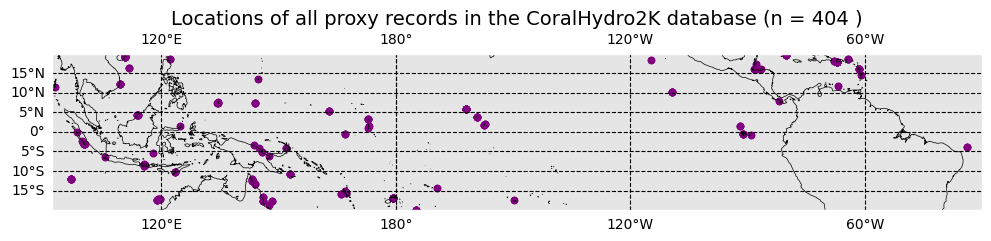

In [42]:
proxy_map([92,330,-20,20])

In [38]:
npz = np.load('proxy_map.npz')
npz['lons'].shape

(404,)